Please see below: This challenge is designed to test your technical and analytics skills on a real-world data set. We'll use the New York taxis data - in particular the Green taxis - as our experimental data set. Please download Green taxi data for February 2016 from this site: https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page

 

Please zip all code and outputs and email them back to Erik by Friday, January 15th.

 

1. Download the data, load it into python. Report the number of rows and columns that you've loaded.

2. Visualize trip distance by time of day in any way you see fit, any observations?

3. What are the most popular pickup locations on weekends vs weekdays?

4. Build a model to forecast the number of trips by hour for the next 12 hours after Feb 12th 10:00 am. How well did you do?

# Dependencies

In [8]:
# basic starters
import pandas as pd
import warnings
from pandas import read_csv
import datetime as dt
#!pip install tabulate
import gc
gc.collect()
import numpy as np
import urllib.request
import zipfile
import random
import itertools
import math
from math import sqrt

# geospatial
import geopandas
from shapely.geometry import Point
from shapely.geometry import Polygon
from descartes.patch import PolygonPatch

# Visualization & diagnostics
import plotly.express as px
import fiona
from tabulate import tabulate
from matplotlib import pyplot
import matplotlib as mpl
from chart_studio.plotly import plot_mpl
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import plotly.graph_objects as go
import webbrowser
import matplotlib.pyplot as plt
import chart_studio.plotly as ply
import bokeh, bokeh.plotting, bokeh.models
from bokeh.palettes import Blues8
Blues8.reverse()
from bokeh.io import output_notebook, show, export_svgs
output_notebook()

# modeling
import pmdarima as pm
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error
import statsmodels as sm
import scipy.stats as stats
#plt.style.use('ggplot')
#%matplotlib inline

Loading BokehJS ...

## 1. Download the data, load it into python. Report the number of rows and columns that you've loaded.

### Ans: Total 1510722 rows with 21 columns.

# Data preparation
We see Ehail_fee is all null and 2 observations have trip_type = null. For our analysis, I think we can ignore these.

In [2]:
df = pd.read_csv('green_tripdata_2016-02.csv')
df.head()

,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,...,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type
0,2,2016-02-01 00:00:01,2016-02-01 00:10:06,N,1,-73.939018,40.805214,-73.972534,40.785885,1,...,10.5,0.5,0.5,0.00,0.0,NaN,0.3,11.80,2,1.0
1,2,2016-02-01 00:01:33,2016-02-01 00:20:13,N,1,-73.891495,40.746651,-73.890877,40.743896,1,...,13.0,0.5,0.5,0.00,0.0,NaN,0.3,14.30,2,1.0
2,2,2016-02-01 00:03:46,2016-02-01 00:21:04,N,1,-73.983780,40.676132,-73.956978,40.718327,1,...,17.5,0.5,0.5,3.76,0.0,NaN,0.3,22.56,1,1.0
3,2,2016-02-01 00:00:05,2016-02-01 00:06:48,N,1,-73.807518,40.700375,-73.831657,40.705978,1,...,8.0,0.5,0.5,0.00,0.0,NaN,0.3,9.30,2,1.0
4,2,2016-02-01 00:06:20,2016-02-01 00:08:47,N,1,-73.903961,40.744934,-73.900009,40.733601,5,...,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0


In [3]:
df.columns = [i.strip().lower() for i in list(df.columns)]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1510722 entries, 0 to 1510721
Data columns (total 21 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   vendorid               1510722 non-null  int64  
 1   lpep_pickup_datetime   1510722 non-null  object 
 2   lpep_dropoff_datetime  1510722 non-null  object 
 3   store_and_fwd_flag     1510722 non-null  object 
 4   ratecodeid             1510722 non-null  int64  
 5   pickup_longitude       1510722 non-null  float64
 6   pickup_latitude        1510722 non-null  float64
 7   dropoff_longitude      1510722 non-null  float64
 8   dropoff_latitude       1510722 non-null  float64
 9   passenger_count        1510722 non-null  int64  
 10  trip_distance          1510722 non-null  float64
 11  fare_amount            1510722 non-null  float64
 12  extra                  1510722 non-null  float64
 13  mta_tax                1510722 non-null  float64
 14  tip_amount        

In [4]:
df.isnull().sum()

vendorid                       0
lpep_pickup_datetime           0
lpep_dropoff_datetime          0
store_and_fwd_flag             0
ratecodeid                     0
pickup_longitude               0
pickup_latitude                0
dropoff_longitude              0
dropoff_latitude               0
passenger_count                0
trip_distance                  0
fare_amount                    0
extra                          0
mta_tax                        0
tip_amount                     0
tolls_amount                   0
ehail_fee                1510722
improvement_surcharge          0
total_amount                   0
payment_type                   0
trip_type                      2
dtype: int64

## 2. Visualize trip distance by time of day in any way you see fit, any observations?

# Exploratory Data Analysis
We can refer to data dictionary from below to understand data structures. Variables are generally skewed but for our purpose, we would not need to pay much attention on skewness. We will, however, explore the distribution of each variable by convention to learn more about the data in general to examine if we have to remove some data points.

In [16]:
webbrowser.open('https://www1.nyc.gov/assets/tlc/downloads/pdf/data_dictionary_trip_records_green.pdf')

True

In [6]:
df.skew()

vendorid                  -1.388538
ratecodeid                19.063638
pickup_longitude          22.497211
pickup_latitude          -24.105550
dropoff_longitude         23.334417
dropoff_latitude         -25.151814
passenger_count            3.268545
trip_distance              4.268356
fare_amount                5.598234
extra                      0.917686
mta_tax                   -4.843929
tip_amount                20.906879
tolls_amount             388.367041
ehail_fee                       NaN
improvement_surcharge     -6.832143
total_amount               6.257246
payment_type               0.363822
trip_type                  6.608821
dtype: float64

In [7]:
df.kurtosis()

vendorid                     -0.071963
ratecodeid                 2175.497181
pickup_longitude            549.788964
pickup_latitude             580.440392
dropoff_longitude           596.237770
dropoff_latitude            632.253411
passenger_count              10.007127
trip_distance                94.443097
fare_amount                 196.107075
extra                         4.094247
mta_tax                      90.537222
tip_amount                 1909.859780
tolls_amount             236284.300281
ehail_fee                          NaN
improvement_surcharge        53.793504
total_amount                247.027762
payment_type                 -0.362629
trip_type                    41.676565
dtype: float64

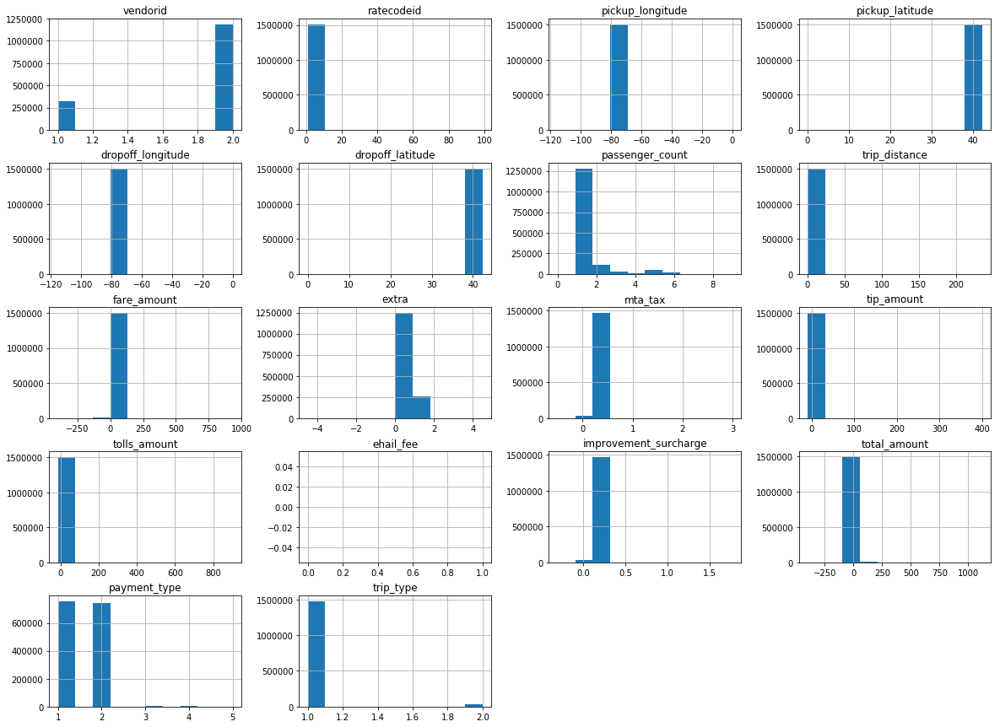

In [9]:
df.hist(figsize=(20,15))
plt.show()

In [5]:
df.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,vendorid,ratecodeid,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type
count,1510722.00000,1510722.00000,1510722.00000,1510722.00000,1510722.00000,1510722.00000,1510722.00000,1510722.00000,1510722.00000,1510722.00000,1510722.00000,1510722.00000,1510722.00000,0.00000,1510722.00000,1510722.00000,1510722.00000,1510720.00000
mean,1.78515,1.09133,-73.81939,40.67786,-73.82837,40.68164,1.35240,2.73312,11.74856,0.34982,0.48696,1.22578,0.10173,nan,0.29218,14.20499,1.50875,1.02143
std,0.41072,0.61379,3.09986,1.68044,2.97462,1.61049,1.01962,2.84441,9.39757,0.38186,0.08790,2.42573,1.35732,nan,0.05129,10.87969,0.52557,0.14483
min,1.00000,1.00000,-115.28249,0.00000,-115.33221,0.00000,0.00000,0.00000,-400.00000,-4.50000,-0.50000,-10.00000,-12.50000,nan,-0.30000,-400.00000,1.00000,1.00000
25%,2.00000,1.00000,-73.96089,40.69459,-73.96796,40.69611,1.00000,1.00000,6.00000,0.00000,0.50000,0.00000,0.00000,nan,0.30000,7.80000,1.00000,1.00000
50%,2.00000,1.00000,-73.94675,40.74654,-73.94559,40.74694,1.00000,1.80000,9.00000,0.50000,0.50000,0.00000,0.00000,nan,0.30000,11.00000,1.00000,1.00000
75%,2.00000,1.00000,-73.91901,40.80243,-73.91279,40.79215,1.00000,3.44000,14.50000,0.50000,0.50000,2.00000,0.00000,nan,0.30000,17.16000,2.00000,1.00000
max,2.00000,99.00000,0.00000,42.32435,0.00000,42.32436,9.00000,235.50000,933.50000,4.50000,3.00000,400.00000,902.17000,nan,1.77000,1121.16000,5.00000,2.00000


From above, we know something went wrong. There is no way longitude/latitude becomes 0. Also, we see that minimum trip_distance is 0 but as our goal is to count number of trips made and calculate trip distance, let's remove any data points with trip_distance = 0. Total_amount being less than 0 is also another type of error but this might not mean that drivers did not travel properly. I would assume that any driver with total_amount < 0 might had some technical error in fare meter machine during driving but made a successful trip. As a result, we will only remove rows from longtitude/latitude being 0 and rows from trip_distance being 0. The total number of rows being removed is around 21.2k. Removing 21.2k rows shouldn't be a big problem given that we have more than 1.5 million rows.

In [8]:
filter1 = (df['pickup_longitude']!=0) & (df['pickup_latitude']!=0) & (df['dropoff_longitude']!=0) & (df['dropoff_latitude']!=0)
df = df[filter1]

filter2 = (df['trip_distance'] != 0)
df = df[filter2]

In [10]:
print('toal number of rows after being removed above filters:', 1510722 - len(df))

toal number of rows after being removed above filters: 21214


# Feature engineering
In order to answer question 2 & 3, I will need to create new columns such as pickup_hour, is_weekend (True/False) and merge existing CSV with geographical shape file to filter by location/zone/borough as necessary. The process is quite extensive so that I had to export pre-processed/feature engineered dataset to CSV and then import again to save up the memory. You probably do not need to re-run all the codes below as it might take some time to process or sometimes can throw a memory error. Please just import newly pre-processed CSV file that I saved after feature engineering.

In [4]:
# First, convert pickup and drop off datetime variable in their specific righ format
df['pickup_dt'] = df.lpep_pickup_datetime.apply(lambda x:dt.datetime.strptime(x,"%Y-%m-%d %H:%M:%S"))
df['dropoff_dt'] = df.lpep_dropoff_datetime.apply(lambda x:dt.datetime.strptime(x,"%Y-%m-%d %H:%M:%S"))

# Second, create a variable for pickup hours
df['pickup_hour'] = df.pickup_dt.apply(lambda x:x.hour)

In [5]:
# Let's create another column called is_weekend to filter data by is_weekend = True/False for each pickup_dt
day_of = df.pickup_dt.apply(lambda x:x.weekday())
weekdays = ("Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday")
day_of_str = day_of.apply(lambda x:weekdays[x])
df['weekdays'] = day_of_str
df['is_weekend'] = df.weekdays.isin(['Friday','Saturday','Sunday'])
#df['is_weekend'][df['is_weekend'] == True] = 1
#df['is_weekend'][df['is_weekend'] == False] = 0

# Let's be more specific -- let's assume Friday after 5pm to be weekend.
df['is_weekend'].loc[(df['weekdays'] == 'Friday') & (df['pickup_hour'] <= 17)] = False

C:\Users\andy\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [6]:
# let's export it to save memory. We will need to import this back again for Q.4. My machine has really low memory so cannot handle data processing well.. 
df.to_csv('df_clean_v2.csv', index = False)

Let's merge our existing dataframe with shape data I downloaded from website (https://geo.nyu.edu/catalog/nyu_2451_36743)
The shape file is from 2016 and saved locally as nyu_2451_36743.shp. For convinience, I will also attach this .shp file via email. It is a geospatial map of taxi zones in NYC. We can do spatial join with existing data sets to check if our coordinates in existing dataframe are "within" one of the boroughs/zones from above shape file for pickup/dropoff coordinates. 

From this process, we can then have locationID for each coordinates in our original dataframe. Due to memory issue, I had to merge dataframe without borough/zone from shape file for each pickup/dropoff but only with LocationID first. And then, had to merge this merged data set again with another CSV file with Taxi Zone/boroughs with LocationID downloaded from the link I specified (https://s3.amazonaws.com/nyc-tlc/misc/taxi+_zone_lookup.csv).

In [13]:
## pickup data frame with locationID -- run this to generate dataframe for locationID but I already ran this and saved as CSV so no need to run again.
# lon_var = 'pickup_longitude'
# lat_var = 'pickup_latitude'

# localdf = df[[lon_var, lat_var]].copy()
# #localdf = df[df['is_weekend'] == True]

# # missing lat lon info is indicated by nan. Fill with zero
# # which is outside New York shapefile.
# localdf[lon_var] = df[lon_var].fillna(value=0.)
# localdf[lat_var] = df[lat_var].fillna(value=0.)

# shape_df = geopandas.read_file('shape/nyu_2451_36743.shp')
# shape_df.drop(['OBJECTID', "Shape_Area", "Shape_Leng", "borough", "zone"],
#               axis=1, inplace=True)
# shape_df = shape_df.to_crs({'init': 'epsg:4326'})

# local_gdf = geopandas.GeoDataFrame(
#     localdf, crs={'init': 'epsg:4326'},
#     geometry=[Point(xy) for xy in
#               zip(localdf[lon_var], localdf[lat_var])])

# local_gdf = geopandas.sjoin(
#     local_gdf, shape_df, how='left', op='within')

In [8]:
## dropoff data frame with locationID
# lon_var2 = 'dropoff_longitude'
# lat_var2 = 'dropoff_latitude'

# localdf2 = df[[lon_var2, lat_var2]].copy()
# #localdf = df[df['is_weekend'] == True]

# # missing lat lon info is indicated by nan. Fill with zero
# # which is outside New York shapefile.
# localdf2[lon_var2] = df[lon_var2].fillna(value=0.)
# localdf2[lat_var2] = df[lat_var2].fillna(value=0.)

# shape_df = geopandas.read_file('shape/nyu_2451_36743.shp')
# shape_df.drop(['OBJECTID', "Shape_Area", "Shape_Leng", "borough", "zone"],
#               axis=1, inplace=True)
# shape_df = shape_df.to_crs({'init': 'epsg:4326'})


# local_gdf2 = geopandas.GeoDataFrame(
#     localdf2, crs={'init': 'epsg:4326'},
#     geometry=[Point(xy) for xy in
#               zip(localdf2[lon_var2], localdf2[lat_var2])])

# local_gdf2 = geopandas.sjoin(
#     local_gdf2, shape_df, how='left', op='within')

Above codes merge existing CSV with pickup/dropoff coordinates to get LocationID for each element. Above process takes much memory so I commented out the codes. I will use this data frame to join with taxi zone lookup CSV file by LocationID I found out from website again as I described earlier. To save up the memory, I exported the merged dataframe into csv, then had to shutdown notebook and then later imported CSV file back. My machine has really low memory capacity so I had no choice but to do this in this way. 

In [14]:
# local_gdf.to_csv('df_pickup.csv', index = False)
# local_gdf2.to_csv('df_dropoff.csv', index = False)

In [2]:
# local_gdf = pd.read_csv('df_pickup.csv')
# local_gdf2 = pd.read_csv('df_dropoff.csv')

In [9]:
# local_gdf['dropoff_longitude'] = local_gdf2['dropoff_longitude'] 
# local_gdf['dropoff_latitude'] = local_gdf2['dropoff_latitude'] 
# local_gdf['dropoff_geometry'] = local_gdf2['geometry'] 
# local_gdf['dropoff_locationid']  = local_gdf2['LocationID'] 

# local_gdf = local_gdf[['pickup_longitude', 'pickup_latitude', 'LocationID', 'dropoff_locationid', 'dropoff_longitude', 'dropoff_latitude', 'geometry', 'dropoff_geometry' ]]
# local_gdf.rename({'LocationID': 'pickup_locationid', 'geometry': 'pickup_geometry'}, axis='columns', inplace=True)

In [11]:
#local_gdf.to_csv('df_pickup_dropoff.csv', index = False)

In [12]:
#local_gdf = pd.read_csv('df_pickup_dropoff.csv')

In [9]:
#df_taxi_location = pd.read_csv('df_taxi_location.csv')

In [9]:
# lookup = pd.read_csv('https://s3.amazonaws.com/nyc-tlc/misc/taxi+_zone_lookup.csv')


# # check pick up location borough and service zone
# df_pickup_dropoff = local_gdf.merge(lookup[['Borough', 'service_zone', 'LocationID']], how='left', left_on='pickup_locationid',
#               right_on='LocationID')
# df_pickup_dropoff.rename({'Borough': 'pickup_boro', 'service_zone': 'pickup_servicezone'}, axis='columns', inplace=True)
# df_pickup_dropoff.drop(columns=['LocationID'], inplace=True)

In [10]:
# # check drop off location borough and service zone
# df_pickup_dropoff = df_pickup_dropoff.merge(lookup[['Borough', 'service_zone', 'LocationID']], how='left', left_on='dropoff_locationid',
#               right_on='LocationID')
# df_pickup_dropoff.rename({'Borough': 'dropoff_boro', 'service_zone': 'dropoff_servicezone'}, axis='columns', inplace=True)
# df_pickup_dropoff.drop(columns=['LocationID'], inplace=True)

# # define JFK/LGA airport pickup/dropoff zones
# df_pickup_dropoff['pickup_boro'].loc[(df_pickup_dropoff['pickup_locationid'] == 138)] = 'LGA'
# df_pickup_dropoff['dropoff_boro'].loc[(df_pickup_dropoff['dropoff_locationid'] == 138)] = 'LGA'

# df_pickup_dropoff['pickup_boro'].loc[(df_pickup_dropoff['pickup_locationid'] == 132)] = 'JFK'
# df_pickup_dropoff['dropoff_boro'].loc[(df_pickup_dropoff['dropoff_locationid'] == 132)] = 'JFK'

C:\Users\andy\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andy\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andy\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andy\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWa

In [20]:
# # create trip_region variable to define trip regions: within boroughs, cross boroughs or airport trips
# df_pickup_dropoff['trip_region'] = 'noairport'

# df_pickup_dropoff['trip_region'].loc[
#     (df_pickup_dropoff['pickup_boro'].isin(['JFK', 'LGA', 'EWR'])) | (df_pickup_dropoff['dropoff_boro'].isin(['JFK', 'LGA', 'EWR'])) ] = 'airport'

C:\Users\andy\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [12]:
# df_pickup_dropoff.to_csv('df_pickup_dropoff_locationid.csv', index = False)

In [5]:
# # Third, create a variable for trip date hours for time series modeling (well this is not necessary so we can skip it for now.)
# df['trip_date_hr'] = df.pickup_dt.apply(lambda x:dt.datetime.strptime(x,"%Y-%m-%d %H"))
# test = df['lpep_pickup_datetime'][0].split(' ')[0] + ' ' + str(df['pickup_hour'][0])

From above codes, you can see that I re-engineered merged data set by adding some new columns such as trip_reigion to distinguish trips going to/coming from airports and no-airport trips. The data is ready for Q.2! 

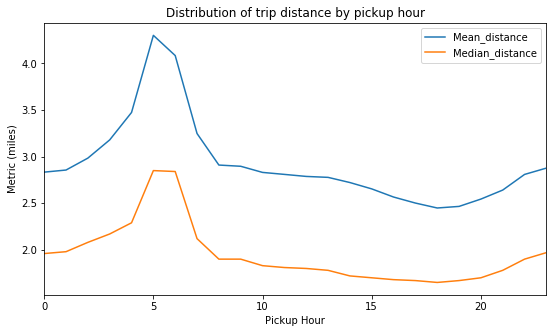

  Hour    Mean distance    Median distance
------  ---------------  -----------------
     0          2.83345               1.96
     1          2.85601               1.98
     2          2.98392               2.08
     3          3.17936               2.17
     4          3.47354               2.29
     5          4.30085               2.85
     6          4.08407               2.84
     7          3.24766               2.12
     8          2.90942               1.9
     9          2.89632               1.9
    10          2.83049               1.83
    11          2.80921               1.81
    12          2.78742               1.8
    13          2.77734               1.78
    14          2.72183               1.72
    15          2.65375               1.7
    16          2.56638               1.68
    17          2.50175               1.67
    18          2.44874               1.65
    19          2.46578               1.67
    20          2.54437               1.7
    21          

In [11]:
# Mean and Median of trip distance by pickup hour
# I will generate the table but also generate a plot for a better visualization

fig,ax = plt.subplots(1,1,figsize=(9,5)) # prepare fig to plot mean and median values
# use a pivot table to aggregate Trip_distance by hour
table1 = df.pivot_table(index='pickup_hour', values='trip_distance',aggfunc=('mean','median')).reset_index()
# rename columns
table1.columns = ['Hour','Mean_distance','Median_distance']
table1[['Mean_distance','Median_distance']].plot(ax=ax)
plt.ylabel('Metric (miles)')
plt.xlabel('Pickup Hour')
plt.title('Distribution of trip distance by pickup hour')
#plt.xticks(np.arange(0,30,6)+0.35,range(0,30,6))
plt.xlim([0,23])
plt.savefig('Question3_1.jpeg',format='jpeg')
plt.show()

print (tabulate(table1.values.tolist(),["Hour","Mean distance","Median distance"]))

Above result made me think that there might be some factors causing sudden increase in terms of mean/median trip distance between 4am to 6am.
Is it because people usually ride longer than usual to get to work? Or, is it because maybe people make a trip to airport (or vice versa, coming from airport) during that time range?
We need to explore more to understand why this sudden increase happened.

### Insights

### Possible reason 1 - Airport rides as a factor to cause longer rides between 4 to 6:59am

Based on the median values, we can see that the distance of trip during 3:00 PM to 8:59 PM tended to be the shortest and trips started between 4:00 AM and 6:59 AM tend to be the longest. 
The sudden increase during the morning is likely driven partly by trips to the airports. Of course, other long-distance rides are also causing the increase during the morning but examining aiport trips is definately interesting. Please refer to statistics and graphs below.

In [ ]:
# let's import pre-processed data sets from above to save up memory again
# df_airport = pd.read_csv('df_pickup_dropoff_locationid.csv')

In [7]:
# df_airport['pickup_hour'] = df['pickup_hour']
# df_airport['trip_distance'] = df['trip_distance']
# df_airport['ratecodeid'] = df['ratecodeid']
# df_airport['weekdays'] = df['weekdays']
# df_airport['is_weekend'] = df['is_weekend']

In [10]:
# Had to export csv again... :( .. My machine could not handle much memory!!!
# df_airport.to_csv('df_pickup_dropoff_locationid_complete.v3.csv', index = False)

In [2]:
df_airport = pd.read_csv('df_pickup_dropoff_locationid_complete.v3.csv')
# df_airport['is_weekend'].loc[(df_airport['weekdays'] == 'Friday') & (df_airport['pickup_hour'] <= 17)] = False

In [3]:
# create trip_region variable to define trip regions: within boroughs, cross boroughs or airport trips
# Let's revise trip_region as noairport vs airport as we combined df_airport with df now.
# From website, I learned that ratecodeid of 2 and 3 belong to airport trips.

df_airport['trip_region'] = 'noairport'

df_airport['trip_region'].loc[
    (df_airport['ratecodeid'].isin([2,3]) | df_airport['pickup_boro'].isin(['JFK', 'LGA', 'EWR'])) | (df_airport['dropoff_boro'].isin(['JFK', 'LGA', 'EWR'])) ] = 'airport'

C:\Users\andy\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Keep in mind that ratecodes 2 and 3 are just part of airport trips. True total number of airport trips consists of trips from ratecodes IN (2,3) + trips to JFK/LAG/EWR. To capture full picture of aiport trips, I had to use external sources from NYU data hub to capture if any taxi trips' pickups/drop-offs happened "within" JFK/LAG/EWR zone. This way, I could capture more aiport trips than just relying on ratecodes IN (2,3) alone.

In [7]:
print('total number of trips - airport vs no-airport')
df_airport.groupby('trip_region').size()

totla number of trips - airport vs no-airport


trip_region
airport        27544
noairport    1461964
dtype: int64

In [8]:
print('total number of trips (%) - airport vs no-airport')
( df_airport.groupby('trip_region').size() / len(df_airport) ) * 100

total number of trips (%) - airport vs no-airport


trip_region
airport       1.849201
noairport    98.150799
dtype: float64

In [9]:
print('mean of trip distance - airport vs no-airport')
df_airport.groupby('trip_region')['trip_distance'].mean()

mean of trip distance - airport vs no-airport


trip_region
airport      9.52108
noairport    2.64025
Name: trip_distance, dtype: float64

In [10]:
print('median of trip distance - airport vs no-airport')
df_airport.groupby('trip_region')['trip_distance'].median()

median of trip distance - airport vs no-airport


trip_region
airport      8.435
noairport    1.790
Name: trip_distance, dtype: float64

In [11]:
print('mean of trip distance during 4 to 6:59am - airport vs no-airport')
df_airport[df_airport.pickup_hour.isin([4,5,6])].groupby('trip_region')['trip_distance'].mean()

mean of trip distance during 4 to 6:59am - airport vs no-airport


trip_region
airport      10.560530
noairport     3.349262
Name: trip_distance, dtype: float64

In [12]:
print('median of trip distance during 4 to 6:59am - airport vs no-airport')
df_airport[df_airport.pickup_hour.isin([4,5,6])].groupby('trip_region')['trip_distance'].median()

median of trip distance during 4 to 6:59am - airport vs no-airport


trip_region
airport      10.10
noairport     2.35
Name: trip_distance, dtype: float64

In [10]:
table1 = df_airport.pivot_table(index=['trip_region','pickup_hour'], values='trip_distance',aggfunc=('mean','median')).reset_index()

In [34]:
# Mean and Median of trip distance by pickup hour
# I will generate the table but also generate a plot for a better visualization

# use a pivot table to aggregate Trip_distance by hour
table1 = df_airport.pivot_table(index=['trip_region','pickup_hour'], values='trip_distance',aggfunc=('mean','median')).reset_index()
# rename columns
table1.columns = ['is_airport', 'Pickup Hour','Mean_distance','Median_distance']


# fig = px.line(table1, x="Hour", y="Mean_distance", color='is_airport')
# fig.show()

fig = px.line(table1, x="Pickup Hour", y="Median_distance", color='is_airport')
fig.show()

print (tabulate(table1.values.tolist(),["Pickup Hour","Mean distance","Median distance"]))

             Pickup Hour    Mean distance    Median distance
---------  -------------  ---------------  -----------------
airport                0          5.14679              0.21
airport                1          6.06759              3.215
airport                2          8.20089              6.72
airport                3          7.80721              6.44
airport                4          9.33153              7.935
airport                5         11.2348              10.9
airport                6         10.6875              10.45
airport                7         10.108                9.66
airport                8          9.58534              8.86
airport                9          9.55844              8.4
airport               10          9.07982              8.05
airport               11          8.74652              7.58
airport               12          8.96543              7.93
airport               13          9.46083              8.405
airport               14         10.1

Airport trip is only about 2% of all trips so we cannot really say airport trip is the only factor that caused the surge during the morning. However, it is still worth investigating as the mean/median trip distance for airport is significantly higher. Especially note that during 4 to 6:59am, median distance for airport trips increases much faster compared to other hours than for noairport trips. It is clear that mean/median distance for airport trips are lot longer than no-airport trips for sure in the early morning. This may explain the reason as to why green taxis' trip distance surges during the morning at least partially.

In [35]:
print('total number of trips by ratecode id')
df_airport.groupby('ratecodeid').size()

total number of trips by ratecode id


ratecodeid
1    1460974
2       2584
3        744
4        750
5      24440
6         16
dtype: int64

In [36]:
#### pd.set_option('display.max_rows', 1000)
print('median of total number of trips by ratecode id during 4 to 6:59am')
df_airport[df_airport.pickup_hour.isin([4,5,6])].groupby(['ratecodeid','pickup_hour'])['trip_distance'].median()

median of total number of trips by ratecode id during 4 to 6:59am


ratecodeid  pickup_hour
1           4               2.250
            5               2.800
            6               2.800
2           4              18.170
            5              18.455
            6              18.120
3           4              16.640
            5              16.910
            6              17.590
4           4              18.610
            5              13.430
            6              14.420
5           4               4.500
            5               4.300
            6               3.825
6           5               0.200
            6               1.650
Name: trip_distance, dtype: float64

Note: 
* 2=JFK
* 3=Newark
* 4=Nassau or Westchester

Ratecodes (the final rate code in effect at the end of the trip.) such as 2,3 and 4 have generally higher median than overall median trip distance during 4 to 6:59am. Given that 2 and 3 belong to airport trips, we confirmed again that it is worth investigating the patterns between airport vs no-airport trips to see how airport trips caused the surge during the morning. Keep in mind that ratecodes 2 and 3 are just part of airport trips as we discussed earlier but this gives us some signal that airport trips, entirely, might cause the surge during the early morning.

In [14]:
# Plot hourly percent of airport and non-airport trips 
trip_count = df_airport.groupby(by=['pickup_hour','trip_region']).count()['trip_distance'].unstack()
trip_count['total'] = trip_count['airport'] + trip_count['noairport'] 
trip_count['airport_pct'] = 100*trip_count['airport']/trip_count['total']
trip_count['nonairport_pct'] = 100*trip_count['noairport']/trip_count['total']



# Create a list of hours
t = list(range(24))
# Create non-airport percent bars
px.bar(x = t, y = trip_count['airport_pct'], labels={'x':'Pickup hour', 'y':'Percent of airport taxi rides (%)'}, title = 'Percentage of airport trips by hour')


#fig.savefig('fig4.svg', format='svg',bbox_inches='tight')

Looking at distribution of % of all airport taxi rides which include ratecodes IN (2,3), JFK, LAG and EWR (out of total rides), we can see that more than 10% of rides during 5AM belong to airport trips. This definately tell us the story that the surge during the early morning is indeed partially driven by long-distanced airport rides.  

### Possible reason 2 - Weekday rides as a factor to cause longer rides between 4 to 6:59am

Based on the median values, we can see that the distance of trip during weekdays during 5AM tend to be the longest. Also note that blue line is going over the red line for the first time during 5AM indicating that the surge in the early morning could be also partially driven by weekday riderships. Please refer to statistics and graphs below.

In [16]:
print('total number of trips - weekdays vs weekends')
df_airport.groupby('is_weekend').size()

total number of trips - weekdays vs weekends


is_weekend
False    905362
True     584146
dtype: int64

In [17]:
print('total number of trips (%) - weekdays vs weekends')
( df_airport.groupby('is_weekend').size() / len(df_airport) ) * 100

total number of trips (%) - weekdays vs weekends


is_weekend
False    60.782621
True     39.217379
dtype: float64

Note that we have more weekdays than weekend (61% vs 39%) and this means that weekday ridership might affect the surge during 4 to 6:59am more so than weekend ridership would do - we can say weekday ridership can be a part of the reasons as to why there is a surge during the early morning.

In [37]:
# Mean and Median of trip distance by pickup hour
# I will generate the table but also generate a plot for a better visualization

# use a pivot table to aggregate Trip_distance by hour
table2 = df_airport.pivot_table(index=['is_weekend','pickup_hour'], values='trip_distance',aggfunc=('mean','median')).reset_index()
# rename columns
table2.columns = ['is_weekend', 'Pickup Hour','Mean_distance','Median_distance']


# fig = px.line(table1, x="Hour", y="Mean_distance", color='is_airport')
# fig.show()

fig = px.line(table2, x="Pickup Hour", y="Median_distance", color='is_weekend')
fig.show()

print (tabulate(table1.values.tolist(),["Pickup Hour","Mean distance","Median distance"]))

             Pickup Hour    Mean distance    Median distance
---------  -------------  ---------------  -----------------
airport                0          5.14679              0.21
airport                1          6.06759              3.215
airport                2          8.20089              6.72
airport                3          7.80721              6.44
airport                4          9.33153              7.935
airport                5         11.2348              10.9
airport                6         10.6875              10.45
airport                7         10.108                9.66
airport                8          9.58534              8.86
airport                9          9.55844              8.4
airport               10          9.07982              8.05
airport               11          8.74652              7.58
airport               12          8.96543              7.93
airport               13          9.46083              8.405
airport               14         10.1

In [18]:
# Plot hourly percent of airport and non-airport trips 
trip_count2 = df_airport.groupby(by=['pickup_hour','is_weekend']).count()['trip_distance'].unstack()
trip_count2['total'] = trip_count2[True] + trip_count2[False] 
trip_count2['weekend_pct'] = 100*trip_count2[True]/trip_count2['total']
trip_count2['weekday_pct'] = 100*trip_count2[False]/trip_count2['total']



# Create a list of hours
t = list(range(24))
# Create non-airport percent bars
px.bar(x = t, y = trip_count2['weekday_pct'], labels={'x':'Pickup hour', 'y':'Percent of weekday rides (%)'}, title = 'Percentage of weekday trips by hour')


#fig.savefig('fig4.svg', format='svg',bbox_inches='tight')

### Summary

The surge in long-distance taxi trips during the early morning was partially driven by more airport rides. To examine the validity of this hypothesis, I plotted the % of airport rides of all taxi trips by hour of day. More than 10% of all taxi rides during 5AM were from airport trips and the % of airport trips between 4:00 AM and 6:59 AM was the highest among all hours of day. Not only that, we learned that airport rides have bigger peaks during the early morning than no-airport rides which further support the hypothesis that the higher mean/median taxi ride distance during early morning was partially caused by airport trips. However, airport rides may not explain the relatively higher mean/median trip distance during late night and before 4AM in the morning (after 10:00 PM and before 4:00 AM) given the low percentage of airport trips during these hours. However, we see that mean/median taxi ride distance for airport rides tend to peak during 8 and 9pm as well. It is possible that passengers are more willing to take taxi rather than public transit (e.g. subway/bus) for longer trips during these hours for safety and convenience.

Also, we should note that weekday ridership might have caused the surge in 5AM as well. We noticed that median trip distance in 5AM during weekdays was far higher than during weekends (3.25 vs 2.44). We also noticed that majority of our trips belong to weekdays (61%). Especially during 5 to 6AM, more than 50% of total rides belong to weekday ridership which further support the hypothesis that weekday ridership could cuase the surge during 5 to 6:59AM.

### 3. What are the most popular pickup locations on weekends vs weekdays?

In [46]:
#Using bokeh to show pick up and drop off locations -- try to graph this for all boroughs if possible!! 
counts = df_airport.groupby(['is_weekend','pickup_locationid'])[['pickup_geometry']].count()
counts = counts.reset_index()
counts.columns = ['is_weekend','pickup_locationid', 'N']

shape_df = geopandas.read_file('shape/nyu_2451_36743.shp')
shape_df.drop(['OBJECTID', "Shape_Area", "Shape_Leng"],
                  axis=1, inplace=True)
shape_df = shape_df.to_crs({'init': 'epsg:4326'})

counts2 = shape_df.merge(counts, left_on='LocationID', right_on='pickup_locationid', how='left')
counts2 = counts2[~counts2['N'].isnull()]

total_n = counts2.groupby('LocationID')['N'].sum().reset_index()
counts2 = counts2.merge(total_n, left_on='LocationID', right_on='LocationID')

gjds = bokeh.models.GeoJSONDataSource(geojson=counts2.to_json())
TOOLS = "pan,wheel_zoom,reset,hover,save"

p = bokeh.plotting.figure(tools=TOOLS,plot_width=100, plot_height=100,
    x_axis_location=None, y_axis_location=None, 
    sizing_mode='scale_width')
color_mapper = bokeh.models.LogColorMapper(palette=Blues8,low=1,high=10000)
# coloring/heatmap classification is based on N_y which is total sum of number of pickups by both weekend and weekdays combined for each LocationID

p.patches('xs', 'ys', 
          fill_color={'field': 'N_y', 'transform': color_mapper},
          fill_alpha=1., line_color="grey", line_width=0.1,          
          source=gjds)

p.grid.grid_line_color = None

hover = p.select_one(bokeh.models.HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = u"""
<div> 
    <div class="bokeh_hover_tooltip">is_weekend : @is_weekend</div>
    <div class="bokeh_hover_tooltip">Name : @zone</div>
    <div class="bokeh_hover_tooltip">Borough : @borough</div>
    <div class="bokeh_hover_tooltip">total number of pickups : @N_x</div>
</div>
"""
# tooltips for total number of pickups is based on N_x which is total sum of number of pickups by each weekend/weekdays for each LocationID

color_bar = bokeh.models.ColorBar(
    color_mapper=color_mapper, orientation='horizontal',
    ticker=bokeh.models.FixedTicker(ticks=[3, 10, 30, 100, 300, 1000, 3000, 10000]),
    formatter=bokeh.models.PrintfTickFormatter(format='%d'),
    label_standoff=12, border_line_color='White', location=(0,0),major_label_text_font_size="8pt")
p.add_layout(color_bar, 'below')

show(p)

C:\Users\andy\Anaconda3\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



In [47]:
pop_pick = counts2.groupby(by=['is_weekend', 'zone'])['N_x'].sum().reset_index()
pop_pick_df = pop_pick.groupby(by=['is_weekend']).apply(lambda x: x.sort_values(['N_x'],ascending = False)).reset_index(drop = True)

pop_pick_df.rename({'N_x': 'n_pickups'}, axis='columns', inplace=True)
pop_pick_df.groupby(by='is_weekend').head(5)

,is_weekend,zone,n_pickups
0,False,East Harlem South,52873.0
1,False,East Harlem North,48772.0
2,False,Central Harlem,47653.0
3,False,Morningside Heights,42305.0
4,False,Astoria,39687.0
217,True,Williamsburg (North Side),34280.0
218,True,Central Harlem,31169.0
219,True,Astoria,29345.0
220,True,East Harlem North,24695.0
221,True,Park Slope,24043.0


* Top 5 pickup locations during week days (Monday to Friday until 5pm) are East Harlem South, East Harlem North, Central Harlem, Morningside Heights, Astoria in terms of total number of pickups.

* Top 5 pickup locations during weekends (Friday after 5pm, Saturday and Sunday) are Williamsburg (North Side), Central Harlem, Astoria, East Harlem North and Park Slope in terms of total number of pickups.

* You can also explore other pickup locations by number of pickups from above interative graph I created by bokeh.

### 4. Build a model to forecast the number of trips by hour for the next 12 hours after Feb 12th 10:00 am. How well did you do?

1. check stationary state of the data set by doing ACF/PACF and KIPP/ADF test.

2. check if there is trend, seasonality or cyclical (trend + seasonality) to see if there is increase in varaince. From this, decide whether to use ETS or ARIMA with differencing and etc.

3. If necessary, use log/box-cox to make non-stationary as stationary.

4. Perform residual diagnostic checks for the models to see if the models are valid (Ljung box test with p-value > 0.05, normalitiy assumptions are met (e.g. homoskedasticity and etc).

5. Produce forecasting results/points for the valid models.

6. Pick the best one in terms of MAPE on test set (the lowest one).

7. Using the best one, do forecast h=12 and present the output.

# Data prepartion for modeling

We will use original dataset (not dataframe refined for Q.3) that is feature engineered for modeling instead. I will use original df for modelling as this will contain all columns as they are. To save up the memory, we will import CSV file once again but you can go ahead and use existing dataframe called df if your machine can handle.

In [ ]:
#df = pd.read_csv('df_clean_v2.csv')

In [3]:
df['pickup_date_hr'] = df.lpep_pickup_datetime.apply(lambda x:x.split(':')[0])
df['pickup_date_hr'] = df.pickup_date_hr.apply(lambda x:dt.datetime.strptime(x,"%Y-%m-%d %H"))

In [4]:
df_model = df.groupby(['pickup_date_hr'])[['pickup_longitude']].count()
#df_model = df.groupby(['pickup_date_hr']).size()

In [5]:
df_model.columns = ['Actual']

In [6]:
train = df_model[df_model.index < '2016-02-12 11:00:00']
test = df_model[(df_model.index > '2016-02-12 10:00:00') & (df_model.index < '2016-02-12 23:00:00')]
data = df_model[df_model.index < '2016-02-12 23:00:00']

In [ ]:
# # this is for Neural Network autoregression model in R. You can export these and run codes in .rmd to check the performance of the model.
# t = pd.DataFrame(train).reset_index()
# t2 = pd.DataFrame(test).reset_index()


# t.to_csv('train.csv',index = False)
# t2.to_csv('test.csv',index = False)

In [9]:
# # in case you get memory error, import this file again

train = pd.read_csv('train.csv')  
test = pd.read_csv('test.csv')

# in case you get memory error, import CSV again and then run the code below
train.pickup_date_hr = train.pickup_date_hr.apply(lambda x:dt.datetime.strptime(x,"%Y-%m-%d %X"))
test.pickup_date_hr = test.pickup_date_hr.apply(lambda x:dt.datetime.strptime(x,"%Y-%m-%d %X"))
train.index = train.pickup_date_hr
train = train[['Actual']]
test.index = test.pickup_date_hr
test = test[['Actual']]

# Exploratory Data Analysis for modeling

In [7]:
def plot_timeseries(ts, title = 'og', opacity = 1):
    """
    Plot plotly time series of any given timeseries ts
    """
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = ts.index, y = ts.values, name = "observed",
                         line_color = 'lightslategrey', opacity = opacity))

    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True)
    fig.show()

In [8]:
plot_timeseries(train['Actual'], title = 'Train data set')

In [9]:
plot_timeseries(test['Actual'], title = 'Test data set')

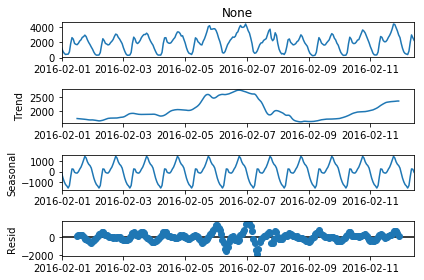

In [43]:
result = seasonal_decompose(train)
fig = result.plot()
#plot_mpl(fig)  if you want interactive graph then turn this on.
fig.show()

From above, we know that our train data set runs from 2016-02-01 00:00:00 to 2016-02-12 10:00:00 and it does appear to have some seasonality and trend component. In addition, it looks like the surge happened during 2016-02-06 until 2016-02-08 which is captured by trend and residual plots. 

# Stationary check

In [11]:
def run_adfuller(ts):
    result = adfuller(ts)
    # Print test statistic
    print("t-stat", result[0])
    # Print p-value
    print("p-value", result[1])
    # Print #lags used
    print("#lags used", result[2])
    # Print critical values
    print("critical values", result[4])

In [12]:
print("for no differencing\n")
run_adfuller(train)
print("\nfor single differencing\n")
run_adfuller(train.diff().dropna())
print("\nfor differenced data set over lags 24 after single differencing\n")
run_adfuller(train.diff().dropna().diff(24).dropna())

for no differencing

t-stat -5.796225244124909
p-value 4.7450840195935926e-07
#lags used 13
critical values {'1%': -3.4556556713934934, '5%': -2.872678352489859, '10%': -2.57270548832225}

for single differencing

t-stat -8.49902575653771
p-value 1.2529081232964982e-13
#lags used 16
critical values {'1%': -3.4560535712549925, '5%': -2.8728527662442334, '10%': -2.5727985212493754}

for differenced data set over lags 24 after single differencing

t-stat -6.387784520730951
p-value 2.142858100402068e-08
#lags used 11
critical values {'1%': -3.458128284586202, '5%': -2.873761835239286, '10%': -2.5732834559706235}


The Augmented Dickey-Fuller test is a type of statistical test called a unit root test.

The intuition behind a unit root test is that it determines how strongly a time series is defined by a trend.

There are a number of unit root tests and the Augmented Dickey-Fuller may be one of the more widely used. It uses an autoregressive model and optimizes an information criterion across multiple different lag values.

The null hypothesis of the test is that the time series can be represented by a unit root, that it is not stationary (has some time-dependent structure). The alternate hypothesis (rejecting the null hypothesis) is that the time series is stationary.

Null Hypothesis (H0): If failed to be rejected, it suggests the time series has a unit root, meaning it is non-stationary. It has some time dependent structure.
Alternate Hypothesis (H1): The null hypothesis is rejected; it suggests the time series does not have a unit root, meaning it is stationary. It does not have time-dependent structure.
We interpret this result using the p-value from the test. A p-value below a threshold (such as 5% or 1%) suggests we reject the null hypothesis (stationary), otherwise a p-value above the threshold suggests we fail to reject the null hypothesis (non-stationary).

p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.
    
source: https://machinelearningmastery.com/time-series-data-stationary-python/

Based on the p-values of the above ADF tests, it seems that train dataset is stationary but if we check the t-stat values it is obvious that the stationarity gets more significant with differencing. The train dataset was declared stationary by the test maybe because the trend in our data is fairly weak (as evident from the decomposed plot). Thus, we can use the original train dataset as it is with the time series models.

# Autocorrelation check

In [13]:
def acf_pacf_plots(ts, lags, figsize = (12,8)):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize = figsize)
    
    # Plot the ACF of ts
    _ = plot_acf(ts, lags = lags, zero = False, ax = ax1, alpha = 0.05)

    # Plot the PACF of ts
    _ = plot_pacf(ts, lags = lags, zero = False, ax = ax2, alpha = 0.05)

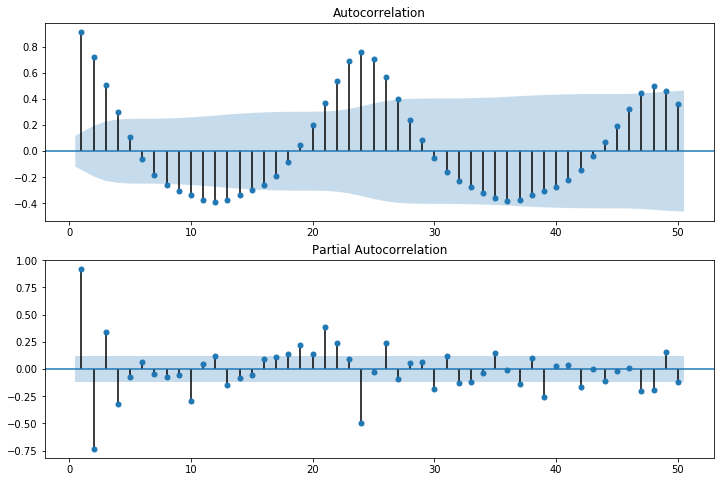

In [14]:
# Create the acf and pacf plots
dfacf = []
dfacf = train
lags = 50

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

Although above graph can lead you to believe that train data is not necessarily white noise as some lags are autocorrelated, since ADF test suggests p-value < 0.05 even for no differencing, we will assume our data is stationary. However, this doesn't mean we won't need to consider autocorrelation as some of the lags are correlated with one another from above plots. We see that some seasonality component is happening as height goes down and then go up again pretty much every 10 periods which leads me to think that there may be some seasonal/autocorrelation things going on. We will consider all of these statistical findings plus practical pattern observations into consideration for modeling later. We probabaly would not need differencing for ARIMA as the data is already stationary but we might definately need p > 1 as AR is somewhat significant from the ACF/PACF plot. Neverthless, we will rely on auto_arima to qualify the best parameters for modelling to find optimal parameters anyway. Not only that, since prescence of autocorrelation in train set is somewhat evident, we will use LSTM (or Neural Network autoregression model) and linear autoregression model as well.

## Modeling 1: Autoregression Model
    
A regression model, such as linear regression, models an output value based on a linear combination of input values (where yhat is the prediction, b0 and b1 are coefficients found by optimizing the model on training data, and X is an input value).
This technique can be used on time series where input variables are taken as observations at previous time steps, called lag variables.

Assumptions:

1. The previous time step(s) is useful in predicting the value at the next time step (dependance between values)
2. Your data is stationary. A time series is stationary if is mean (and/or variance) is constant over time. There are other statistical properties to look at as well, but looking at the mean is usually the fastest/easiest.

Based on our ACF/PACF plot and ADF test result for train data from above, we can use Autoregression model for our purpose.

In [86]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

For our evaluation metric, we will use mean absolute percentage error (MAPE). The MAPE is usually reported as a percentage, which is the above equation multiplied by 100. The difference between y_true and y_pred is divided by the actual value y_true again. The absolute value in this calculation is summed for every forecasted point in time and divided by the number of fitted points n. Multiplying by 100% makes it a percentage error.

### hyperparameter tuning

In [50]:
# optimal lags searching -- choose lags that produces the lowest MAPE on test set
lags = [10,15,20,25,30,35,40,45,50,51,52,53,54,55,60,65,70,71,72,73,74,75,76,77,78,79,80,85,90,100]
warnings.filterwarnings('ignore')

for i in lags:
    model = AutoReg(train, lags=i)
    model_fit = model.fit()
    # make predictions
    predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1)
    
    MAPE = mean_absolute_percentage_error(train['Actual'][i:],model_fit.fittedvalues.values)
    print('lags: ', i)
    print('Train MAPE: %.3f' % MAPE)

    MAPE = mean_absolute_percentage_error(test['Actual'],predictions)
    
    print('Test MAPE: %.3f' % MAPE)

lags:  10
Train MAPE: 15.154
Test MAPE: 32.582
lags:  15
Train MAPE: 14.962
Test MAPE: 32.700
lags:  20
Train MAPE: 14.654
Test MAPE: 18.185
lags:  25
Train MAPE: 9.529
Test MAPE: 11.665
lags:  30
Train MAPE: 9.199
Test MAPE: 11.502
lags:  35
Train MAPE: 9.484
Test MAPE: 10.903
lags:  40
Train MAPE: 9.464
Test MAPE: 9.783
lags:  45
Train MAPE: 9.732
Test MAPE: 9.095
lags:  50
Train MAPE: 10.022
Test MAPE: 8.438
lags:  51
Train MAPE: 10.042
Test MAPE: 8.922
lags:  52
Train MAPE: 9.886
Test MAPE: 9.006
lags:  53
Train MAPE: 9.959
Test MAPE: 8.917
lags:  54
Train MAPE: 9.976
Test MAPE: 8.915
lags:  55
Train MAPE: 10.005
Test MAPE: 8.978
lags:  60
Train MAPE: 9.809
Test MAPE: 9.119
lags:  65
Train MAPE: 9.861
Test MAPE: 8.862
lags:  70
Train MAPE: 9.870
Test MAPE: 8.282
lags:  71
Train MAPE: 9.927
Test MAPE: 8.238
lags:  72
Train MAPE: 9.968
Test MAPE: 8.251
lags:  73
Train MAPE: 10.058
Test MAPE: 8.070
lags:  74
Train MAPE: 10.000
Test MAPE: 8.279
lags:  75
Train MAPE: 9.963
Test MAPE: 8.

## residual diagnostic checks

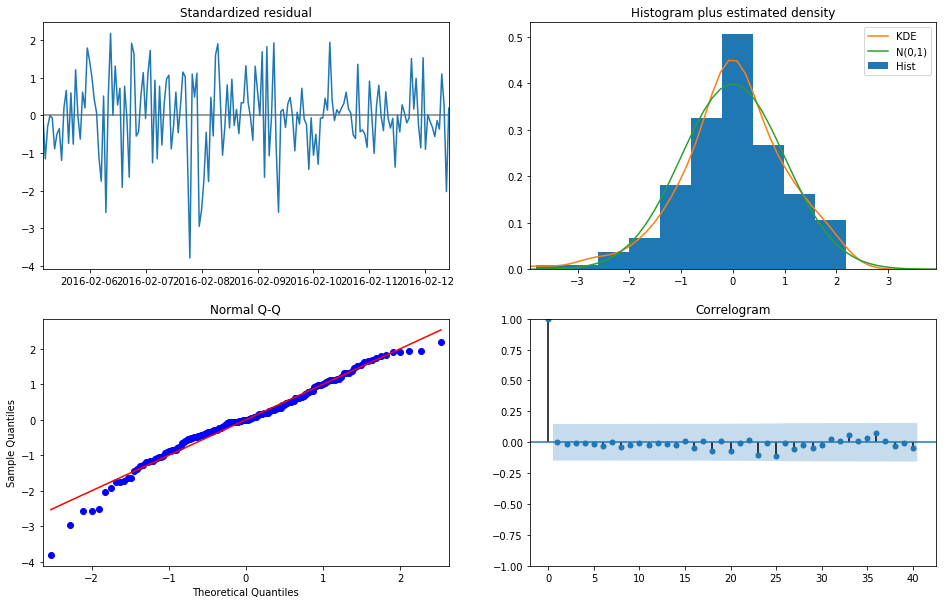

In [51]:
fig = plt.figure(figsize=(16,10))
fig = model_fit.plot_diagnostics(fig = fig, lags=40)

In [52]:
sm.stats.diagnostic.acorr_ljungbox(model_fit.resid.values, return_df=True)

,lb_stat,lb_pvalue
1,0.000044,0.994737
2,0.021521,0.989297
3,0.026243,0.998878
4,0.029506,0.999892
5,0.052218,0.999967
6,0.238980,0.999740
7,0.243271,0.999951
8,0.496389,0.999870
9,0.558491,0.999951
10,0.573907,0.999987


In [90]:
# # line plot of residuals
# residuals = pd.DataFrame(model_fit.resid.values)
# residuals.plot()

In [89]:
# # density plot of residuals
# model_fit.resid.plot(kind='kde')
# # summary stats of residuals
# print(model_fit.resid.describe())

In [92]:
# acf_pacf_plots(model_fit.resid.values,  lags=40, figsize = (12,8))

The model indeed passed all the necessary residual diagnostic checks, thus we can say the model is reliable for forecasting. The residuals assumed to be reasonably normally distributed and no significant autocorrelation in residuals is present. Ljung-box test further confirmed that p-value at each lag is all bigger than 0.05, and thus residuals are white noise. (source: https://otexts.com/fpp2/residuals.html)

## forecasting

Given that the model passed all the necessary residual diagnostic checks, we will now produce forecast output.

predicted=2234.641874, expected=2135.000000
predicted=2208.827421, expected=1993.000000
predicted=2322.817917, expected=2075.000000
predicted=2533.741796, expected=2666.000000
predicted=2863.086296, expected=2957.000000
predicted=3212.290295, expected=3458.000000
predicted=3905.281891, expected=3986.000000
predicted=4370.341441, expected=4515.000000
predicted=4320.518627, expected=4677.000000
predicted=3859.512146, expected=4382.000000
predicted=3494.536744, expected=4006.000000
predicted=3197.092985, expected=3834.000000
Train MAPE: 10.058
Test MAPE: 8.070


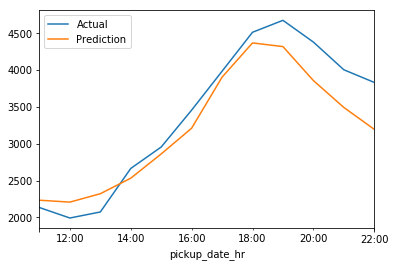

In [53]:
lags = 73 # optimal lags found from above
model = AutoReg(train, lags=lags)
model_fit = model.fit()
# make predictions
predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)

for i in range(len(predictions)):
    print('predicted=%f, expected=%f' % (predictions[i], test['Actual'][i]))
    
MAPE = mean_absolute_percentage_error(train['Actual'][lags:],model_fit.fittedvalues.values)
print('Train MAPE: %.3f' % MAPE)

MAPE = mean_absolute_percentage_error(test['Actual'],predictions)
print('Test MAPE: %.3f' % MAPE)

# plot results for test vs forcast
# pyplot.plot(test)
# pyplot.plot(predictions, color='red')
# pyplot.show()
future_forecast = pd.DataFrame(predictions,index = test.index,columns=['Prediction'])
pd.concat([test,future_forecast],axis=1).plot()

## summary of the model

ACF/PACF residual plots and ljung-box test (p-value > 0.05 for each lag) show that residuals are assumed to be "white noise"(https://otexts.com/fpp2/residuals.html). Line/density plots of residuals show the pattern of fairly normally distributed shape which confirms the results from ACF/PACF plots and ljung-box test. This model is reliable and can be used to forecast future values (h = 12). The MAPE on test set is about 8% after hyperparameter tuning with lags = 73.

# Modeling 2: LSTM

Unfortunately on my machine (bit 32 Windows 7), tensorflow doesn't seem to work. I cannot install tensorflow on my environment no matter what (source: https://stackoverflow.com/questions/38896424/tensorflow-not-found-using-pip).

However, I found something similar to LSTM in R which is called Neural Network autoregression (https://otexts.com/fpp2/nnetar.html) and I implemented the model in R. 

With time series data, lagged values of the time series can be used as inputs to a neural network, just as we used lagged values in a linear autoregression model. We call this a neural network autoregression or NNAR model. 

Please refer to .rmd file and train/test.csv I attached to examine the results of the model further. The model actually produced the lowest MAPE on test set among all models (about 4%).

In [60]:
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# scaler.fit(train)
# scaled_train_data = scaler.transform(train)
# scaled_test_data = scaler.transform(test)

# from keras.preprocessing.sequence import TimeseriesGenerator

# n_input = 12
# n_features= 1
# generator = TimeseriesGenerator(scaled_train_data, scaled_train_data, length=n_input, batch_size=1)
# from keras.models import Sequential
# from keras.layers import Dense
# from keras.layers import LSTM

# lstm_model = Sequential()
# lstm_model.add(LSTM(200, activation='relu', input_shape=(n_input, n_features)))
# lstm_model.add(Dense(1))
# lstm_model.compile(optimizer='adam', loss='mse')

# lstm_model.summary()

# Modeling 3: ARIMA
As our train data is assumed to be stationary, ARIMA is a worth try. We will rely on auto_arima to determine optimal parameters for the model. Given that ACF/PACF plots show AR is somewhat significant, we are expecting auto_arima to generate p > 1.

In [81]:
model3 = pm.auto_arima(train,
                      #start_p=0, start_q=0, start_d = 0,
                      test='adf',       # use adftest to find optimal 'd'
                      #max_p=6, max_q=6, max_d=6, # maximum p and q
                      #m=24,              # frequency of series
                      #d=None,           # let model determine 'd'
                      #seasonal=False,   # No Seasonality
                      #start_P=0, start_Q =0, start_D =0, 
                      #max_P=6, max_Q=6, max_D=6,
                      #seasonal_test = True,
                      #trend = 'ct',
                      #stationary=True,
                      trace=True,
                      #error_action='ignore',  
                      #suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=3899.390, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=4600.847, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=4101.656, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=4278.111, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5028.325, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=3896.101, Time=0.28 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=4072.139, Time=0.41 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=3942.800, Time=0.21 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=3895.178, Time=0.45 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=3951.952, Time=0.60 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=3885.083, Time=0.55 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=3889.326, Time=0.61 sec
 ARIMA(2,0,4)(0,0,0)[0] intercept   : AIC=3894.607, Time=0.20 sec
 ARIMA(1,0,4)(0,0,0)[0] intercept   : AIC=3898.800, Time=0.12 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept

In [82]:
model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  275
Model:               SARIMAX(2, 0, 3)   Log Likelihood               -1935.541
Date:                Wed, 13 Jan 2021   AIC                           3885.083
Time:                        17:45:14   BIC                           3910.400
Sample:                             0   HQIC                          3895.244
                                - 275                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    141.2385     47.864      2.951      0.003      47.427     235.050
ar.L1          1.7125      0.075     22.753      0.000       1.565       1.860
ar.L2         -0.7825      0.057    -13.778      0.000      -0.894      -0.671
ma.L1          0.0608      0.093      0.657      0.511      -0.121       0.242
ma.L2         -0.3464      0.099     -3.489      0.000      -0.541      -0.152
ma.L3         -0.3336      0.076     -4.374      0.000      -0.483      -0.184
sigma2        7.5e+04   6096.959     12.301      0.000    6.31e+04     8.7e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 8.80
Prob(Q):                              0.92   Prob(JB):                         0.01
Heteroskedasticity (H):               1.22   Skew:                             0.15
Prob(H) (two-sided):                  0.34   Kurtosis:                         3.82
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

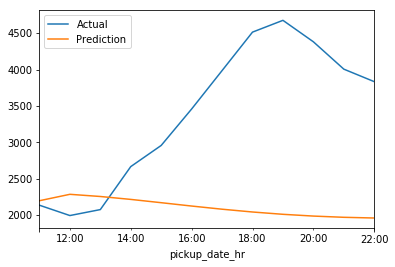

In [91]:
fit = model3.fit(train)
future_forecast3 = model3.predict(n_periods=12)
future_forecast3 = pd.DataFrame(future_forecast3,index = test.index,columns=['Prediction'])
pd.concat([test,future_forecast3],axis=1).plot()

In [98]:
print('MAPE on testset:')
mean_absolute_percentage_error(test['Actual'],future_forecast3)

MAPE on testset:


33.69525211160134

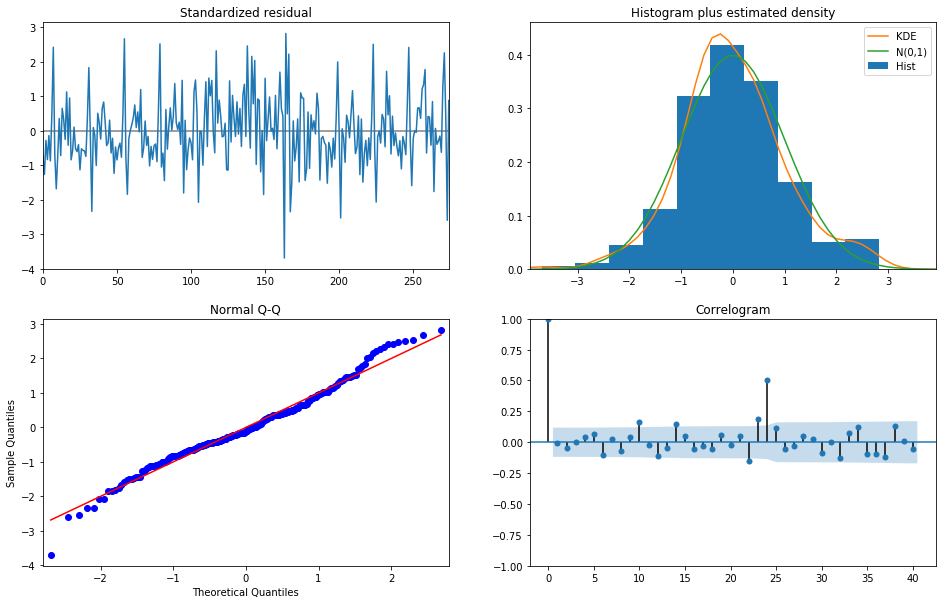

In [90]:
fig = plt.figure(figsize=(16,10))
fig = fit.plot_diagnostics(fig = fig, lags=40)

In [75]:
# # line plot of residuals
# residuals = pd.DataFrame(fit.resid())
# residuals.plot()

In [76]:
# # density plot of residuals
# residuals.plot(kind='kde')
# # summary stats of residuals
# print(residuals.describe())

In [77]:
# acf_pacf_plots(fit.resid(),  lags=40, figsize = (12,8))

In [92]:
sm.stats.diagnostic.acorr_ljungbox(fit.resid(), return_df=True).apply(lambda s: s.apply('{0:.5f}'.format))

C:\Users\andy\Anaconda3\lib\site-packages\statsmodels\stats\diagnostic.py:533: FutureWarning:

The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5). Directly setlags to silence this warning.



,lb_stat,lb_pvalue
1,0.02928,0.86414
2,0.41922,0.81090
3,0.43116,0.93373
4,0.99930,0.90990
5,2.41683,0.78897
6,5.71259,0.45614
7,5.73437,0.57109
8,6.86482,0.55129
9,7.76933,0.55755
10,15.68964,0.10887


Auto_arima suggests SARIMAX with parameters of (2,0,3)(0,0,0)[0] intercept. As the result from ljung-box test on residual suggests, the model is not reliable (p-value becomes less than 0.05 after lag = 13 and thus residuals are generally not white noise) and MAPE on test set is too high (higher than 30%). 

I think the poor performance on test set especially is due to the fact that auto_arima did not give us optimal parameters and often one needs to configure parameters manually. Unfortunately due to memory issue in Python (it gave me an error message saying that I am out of memory so could not perform this task), I could not manually add higher frequency to manually configure the model (it crahsed when I tried with frequency >= 12). My thinking was that if I increase frequency further for seasonal parameters, say 24 or maybe even 48, we would get better fit for SARIMAX. This process was done in R instead (as R surprisingly did not throw memory error). 

The best parameters I configured so far was (5,0,0)(0,1,0)[24] as 24 hours of frequency might improve model accuracy as autocorrelation is somewhat evident in the data. The residual checks showed that p-value > 0.05 from ljung-box test with MAPE on test set being about 7% so I accepted the model in R. As a reference, you can check my .rmd file I sent you along with train/test.csv.

# Modeling 4: ETS
Even though our train data is stationary, we will still try ETS by adding trend and seasonal components to see if it fits as our test data seems to have some trend and seasonal components. Without adding any of trend or seasonal component, it is too obvious that we will have flat forecast line similar to simple exponential smoothing so I am not going to implement that here.

Note:

* Additive Model: useful when the trend and seasonal variation are relatively constant over time (linear)
* Multiplicative Model: useful when the trend and season variation increases or decreases in magnitude over time (exponetial)

We will try 2 implementation of model with trend = 'add' & seasonal = 'mul' and another model with trend = 'mul' & seasonal = 'mul' for experiment.

C:\Users\andy\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

C:\Users\andy\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning:

After 0.13 initialization must be handled at model creation



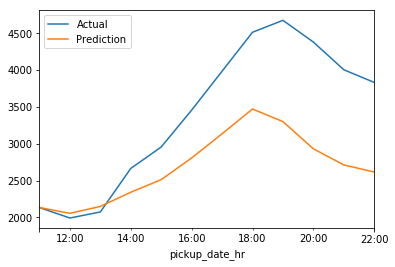

In [93]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
fit1 = ExponentialSmoothing(train, trend='add', seasonal='mul').fit()
fcast1 = fit1.forecast(12)

import chart_studio.plotly as ply
future_forecast2 = pd.DataFrame(fcast1,index = test.index,columns=['Prediction'])
pd.concat([test,future_forecast2],axis=1).plot()

In [94]:
sm.stats.diagnostic.acorr_ljungbox(fit1.resid, return_df=True).apply(lambda s: s.apply('{0:.5f}'.format))

C:\Users\andy\Anaconda3\lib\site-packages\statsmodels\stats\diagnostic.py:533: FutureWarning:

The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5). Directly setlags to silence this warning.



,lb_stat,lb_pvalue
1,79.51633,0.00000
2,87.43737,0.00000
3,89.28194,0.00000
4,94.91936,0.00000
5,102.49931,0.00000
6,111.43192,0.00000
7,116.87095,0.00000
8,120.25917,0.00000
9,123.79918,0.00000
10,124.04934,0.00000


Ljung-box test has p-value < 0.05 at every lag for residual. We do not need normality check further if the model fails in ljung-box test. Failing in ljung-box test (null hypothesis of residuals being white noise is rejected) for residuals alone is already enough condition to say that the model is not reliable and thus no need to produce forecast values.

C:\Users\andy\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

C:\Users\andy\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning:

After 0.13 initialization must be handled at model creation

C:\Users\andy\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



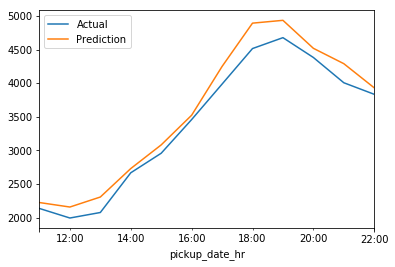

In [95]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
fit1 = ExponentialSmoothing(train, seasonal_periods=80, trend='mul', seasonal='mul').fit()
fcast1 = fit1.forecast(12)

import chart_studio.plotly as ply
future_forecast2 = pd.DataFrame(fcast1,index = test.index,columns=['Prediction'])
pd.concat([test,future_forecast2],axis=1).plot()

I manually configured seasonal_periods = 80 as autocorrelation is somewhat evident in the train set and the actual and prediction values based on test set look very close one another. Would it be just coincidence? Let's do residual diagnostic check to see if the model is indeed reliable or not.

In [96]:
sm.stats.diagnostic.acorr_ljungbox(fit1.resid, return_df=True).apply(lambda s: s.apply('{0:.5f}'.format))

C:\Users\andy\Anaconda3\lib\site-packages\statsmodels\stats\diagnostic.py:533: FutureWarning:

The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5). Directly setlags to silence this warning.



,lb_stat,lb_pvalue
1,0.92982,0.33491
2,0.96260,0.61798
3,17.18197,0.00065
4,17.85373,0.00132
5,18.45344,0.00243
6,21.94456,0.00124
7,24.89761,0.00079
8,28.74385,0.00035
9,28.83492,0.00069
10,35.96262,0.00009


Again, ljung-box test has p-value < 0.05 for each lag after 2nd lag for residual. Indeed, this ETS model is not reliable and thus no need to produce forecast values. It seems like the model worked very well on test set but this is mainly due to just random chance or for this specific case only. The model cannot be used for general cases.

## Which model to choose?

If we are only considering models in Python:

1. We have no choice but to choose linear Autoregression model as it is the only reliable model passing all the necessary residual diagnostic checks that had p-value from ljung-box test for each lag being > 0.05 in residuals. 
2. MAPE on test set for linear Autoregression model was around 8%
3. SARIMAX and ETS failed to qualify reliability as they failed ljung-box test with p-value being < 0.05 for every lag or almost every leg in residuals.

Test MAPE: 8.070


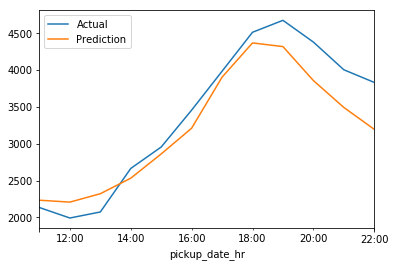

In [56]:
print('Test MAPE: %.3f' % MAPE)
pd.concat([test,future_forecast],axis=1).plot()

If we are considering models in Python and R:

1. We will choose Neural Network Autoregression model as it is a reliable model passing all the necessary residual diagnostic checks with MAPE on test being around 5% on average (please refer to .rmd file I sent you seperately). However, as our assignment is based on Python only, we can just consider NNAR model as a reference only.